# Latent Code Regression
This is a notebook that performs the basic steps for latent code regression. It implements the entire pipeline, from loading an input image, to predicting the respective latent code and generating the corresponding image, depth map and shape. In this notebook:



1. Input RGB Image
2. Load latent code model
3. Predict image's latent code
4. Generate image and depth map
  - Generator requires:
    * Input appropriate camera parameters
    * Intermediate latent code (from mapping network) 



## Dependencies

In [ ]:
#@title Download EG3D
!nvidia-smi
!git clone https://github.com/NVlabs/eg3d

Fri Sep 30 00:54:32 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   57C    P8    10W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
#@title Download EG3D model
model_url = "https://api.ngc.nvidia.com/v2/models/nvidia/research/eg3d/versions/1/files/ffhq512-128.pkl"  #@param {type: "string"}
!wget -c $model_url -O model.pkl
#feature_detector_url = !wget 'https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/metrics/vgg16.pt' # @param {type:string} feature detector
#!wget -c $feature_detector_url -O vgg16.pt

--2022-09-30 00:54:41--  https://api.ngc.nvidia.com/v2/models/nvidia/research/eg3d/versions/1/files/ffhq512-128.pkl
Resolving api.ngc.nvidia.com (api.ngc.nvidia.com)... 54.244.135.130, 44.225.30.106
Connecting to api.ngc.nvidia.com (api.ngc.nvidia.com)|54.244.135.130|:443... connected.
HTTP request sent, awaiting response... 302 
Location: https://prod-model-registry-ngc-bucket.s3.us-west-2.amazonaws.com/org/nvidia/team/research/models/eg3d/versions/1/files/ffhq512-128.pkl?response-content-disposition=attachment%3B%20filename%3D%22ffhq512-128.pkl%22&response-content-type=application%2Foctet-stream&X-Amz-Security-Token=IQoJb3JpZ2luX2VjEJj%2F%2F%2F%2F%2F%2F%2F%2F%2F%2FwEaCXVzLXdlc3QtMiJGMEQCIHP%2Fjyir5Og2D7SEl4eLSa9b6jdCPzEYEcgKx0f2Iw9fAiBcJ21Z5kLp%2FF6NPK3BkYzAwjeUzxI4GyoqYG%2FSgB8XxSrMBAhREAQaDDc4OTM2MzEzNTAyNyIMznbQxHDPPbijsDr5KqkEHFzMr97eEdEXn4RT%2FQSf4HdT2fUy3c%2BZnTs3ZJoKlVRMkBq1tgF46QKMI906%2FghMtq4SIwFmUo13IkkythA7i0Txoi3nE6t8%2F58AU7nYbpXbP%2F0Fs9t9u9jnmqep60vCrm4CsTLYxRj9EjbyKx

In [ ]:
!sudo apt install ninja-build

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
The following NEW packages will be installed:
  ninja-build
0 upgraded, 1 newly installed, 0 to remove and 20 not upgraded.
Need to get 93.3 kB of archives.
After this operation, 296 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 ninja-build amd64 1.8.2-1 [93.3 kB]
Fetched 93.3 kB in 1s (67.6 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg

In [ ]:
!pip install scikit-video

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.3 MB 29.5 MB/s 


In [ ]:
!pip install lpips

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 53 kB 2.0 MB/s 


In [ ]:
!pip install trimesh
!pip install imageio-ffmpeg 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 659 kB 20.0 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 26.9 MB 1.2 MB/s 


In [ ]:
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
import pdb

def init_weights(m):
    if isinstance(m, nn.Conv2d):
        torch.nn.init.xavier_uniform_(m.weight)
        m.bias.data.fill_(0.01)


class UNet(nn.Module):
    def __init__(self, init_weights=True):
        super(UNet, self).__init__()                                #572 * 572 * 3 - input
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3)                   #570 * 570 * 64
        self.conv2 = nn.Conv2d(64, 64, kernel_size=3)                  #568 * 568 * 64
                                                                        #after maxpool 284 * 284 * 64
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3)                 #282 * 282 * 128
        self.conv4 = nn.Conv2d(128, 128, kernel_size=3)                #280 * 280 * 128
                                                                        #after maxpool 140 * 140 * 128
        self.conv5 = nn.Conv2d(128, 256, kernel_size=3)                #138 * 138 * 256
        self.conv6 = nn.Conv2d(256, 256, kernel_size=3)                #136 * 136 * 256
                                                                        #after maxpool 68 * 68 * 256
        self.conv7 = nn.Conv2d(256, 512, kernel_size=3)                #66 * 66 * 512
        self.conv8 = nn.Conv2d(512, 512, kernel_size=3)                #64 * 64 * 512
                                                                        #after maxpool 32 * 32 * 512
        self.conv9 = nn.Conv2d(512, 1024, kernel_size=3)               #30 * 30 * 1024
        self.conv10 = nn.Conv2d(1024, 1024, kernel_size=3)             #28 * 28 * 1024

        self.upsample = nn.Upsample(scale_factor=2, mode='nearest')      #56 * 56 * 1024  
        self.upConv1 = nn.Conv2d(1024, 512, kernel_size=1)               #56 * 56 * 512
                                                                        #after concatenation with crop of 56 * 56 * 512
                                                                        #56 * 56 * 1024
        self.deConv1 = nn.Conv2d(1024, 512, kernel_size = 3)             #54 * 54 * 512
        #self.conv8                                                      #52 * 52 * 512

        #upsample 1                                                      #104 * 104 * 512
        self.upConv2 = nn.Conv2d(512, 256, kernel_size=1)                #104 * 104 * 256
                                                                        #after concatenation with crop of 104 * 104 * 256
                                                                        #104 * 104 * 512 
        self.deConv2 = nn.Conv2d(512, 256, kernel_size = 3)              #102 * 102 * 256
        #self.conv6                                                      #100 * 100 * 256

        #upsample 1                                                      #200 * 200 * 256
        self.upConv3 = nn.Conv2d(256, 128, kernel_size=1)                #200 * 200 * 128
                                                                        #after concatenation with crop of 200 * 200 * 128
                                                                        #200 * 200 * 256 
        self.deConv3 = nn.Conv2d(256, 128, kernel_size = 3)              #198 * 198 * 128
        #self.conv4                                                      #196 * 196 * 128

        #upsample 1                                                      #392 * 392 * 128
        self.upConv4 = nn.Conv2d(128, 64, kernel_size=1)                 #392 * 392 * 64
                                                                        #after concatenation with crop of 392 * 392 * 64
                                                                        #392 * 392 * 128
        self.deConv4 = nn.Conv2d(128, 64, kernel_size = 3)               #390 * 390 * 64
        #self.conv2                                                      #388 * 388 * 64
        self.deConv5 = nn.Conv2d(64, 1, kernel_size = 1)                 #388 * 388 * 1

        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)


        self.convX = nn.Conv2d(512, 512, kernel_size=3)                #64 * 64 * 512
        self.deConvX = nn.Conv2d(14, 512, kernel_size = 1)  
        self.finconvX = nn.Conv2d(512, 512, kernel_size=4)
        self.co = nn.Conv2d(512, 512, kernel_size=(2, 4))
        self.co2 = nn.Conv2d(512, 512, kernel_size=(2, 3))
        self.co3 = nn.Conv2d(512, 512, kernel_size=2)

        if init_weights:
            self._initialize_weights()

    def forward(self, x):
                                                                        #H * W * c
                                                                        #572 * 572 * 3
        out1 = F.relu(self.conv1(x))                                     #570 * 570 * 64
        #print('out1:{}'.format(out1.shape))
        out2 = F.relu(self.conv2(out1))                                  #568 * 568 * 64
        #print('out2:{}'.format(out2.shape))
        out3 = self.pool(out2)                                           #284 * 284 * 64
        #print('out3:{}'.format(out3.shape))
        out4 = F.relu(self.conv3(out3))                                  #282 * 282 * 128
        #print('out4:{}'.format(out4.shape))
        out5 = F.relu(self.conv4(out4))                                  #280 * 280 * 128
        #print('out5:{}'.format(out5.shape))
        out6 = self.pool(out5)                                           #140 * 140 * 128
        #print('out6:{}'.format(out6.shape))
        out7 = F.relu(self.conv5(out6))                                  #138 * 138 * 256
        #print('out7:{}'.format(out7.shape))
        out8 = F.relu(self.conv6(out7))                                  #136 * 136 * 256
        #print('out8:{}'.format(out8.shape))
        out9 = self.pool(out8)                                           #68 * 68 * 256
        #print('out9:{}'.format(out9.shape))
        out10 = F.relu(self.conv7(out9))                                 #66 * 66 * 512
        #print('out10:{}'.format(out10.shape))
        out11 = F.relu(self.conv8(out10))                                #64 * 64 * 512
        #print('out11:{}'.format(out11.shape))
        out12 = self.pool(out11)                                         #32 * 32 * 512
        #print('out12:{}'.format(out12.shape))
        out13 = F.relu(self.conv9(out12))                                #30 * 30 * 1024
        #print('out13:{}'.format(out13.shape))
        out14 = F.relu(self.conv10(out13))                               #28 * 28 * 1024
        #print('out14:{}'.format(out14.shape))

        out15 = self.upsample(out14)                                     #56 * 56 * 1024  
        #print('out15:{}'.format(out15.shape))
        out16 = self.upConv1(out15)                                      #56 * 56 * 512
        #print('out16:{}'.format(out16.shape))
        out17 = self.conv8(out16)
        #print('out17:{}'.format(out17.shape))
        out18 = self.pool(out17)
        #print('out18:{}'.format(out18.shape))
        out19 = self.co(out18)
        #print('out19:{}'.format(out19.shape))
        #out20 = self.pool(out19)
        out20 = self.co(out19)
        out21 = self.co(out20)
        #print('out12:{}'.format(out20.shape))
        out22 = self.co(out21)
        #print('out22:{}'.format(out22.shape))
        out23 = self.co(out22)
        #print('out23:{}'.format(out23.shape))
        out24 = self.co2(out23)
        #print('out24:{}'.format(out24.shape))
        out25 = self.co2(out24)
        #print('out25:{}'.format(out25.shape))
        out26 = self.co2(out25)
        #print('out26:{}'.format(out26.shape))
        out27 = self.co3(out26)
        #print('out27:{}'.format(out27.shape))
        return out27
        
    def _initialize_weights(self):
        self.apply(init_weights)
        

In [ ]:
!pip install pytorch_pretrained_vit
!git clone https://github.com/isl-org/MiDaS
!pip install timm
!pip install vit-pytorch

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for pytorch-pretrained-vit: filename=pytorch_pretrained_vit-0.0.7-py3-none-any.whl size=11132 sha256=15e5983f045464080b750c9a67e0b564f294d45d1e5b63de12736c15becc1024
  Stored in directory: /root/.cache/pip/wheels/87/1d/d1/c6852ef6d18565e5aee866432ab40c6ffbd3411d592035cddb
Successfully built pytorch-pretrained-vit
Cloning into 'MiDaS'...
remote: Enumerating objects: 501, done.
remote: Counting objects: 100% (92/92), done.
remote: Compressing objects: 100% (48/48), done.
remote: Total 501 (delta 69), reused 46 (delta 44), pack-reused 409
Receiving objects: 100% (501/501), 414.88 KiB | 19.76 MiB/s, done.
Resolving deltas: 100% (167/167), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 509 kB 26.1 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wh

## Import

In [ ]:
import sys
if "./eg3d/eg3d" not in sys.path:
    sys.path.append("./eg3d/eg3d")

In [ ]:
from torch_utils import custom_ops
custom_ops.verbosity = "full"

In [ ]:
import os
import re
from typing import List, Optional, Tuple, Union
import scipy
import click
import dnnlib
import numpy as np
import PIL.Image
import torch
from tqdm import tqdm
from skimage import measure
import legacy
from camera_utils import LookAtPoseSampler, FOV_to_intrinsics
from torch_utils import misc
from training.triplane import TriPlaneGenerator

## Mount Drive
Define the path to the dataset for the input data and the ground truth depth maps. Load everything to the dataset.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

input_data_path = '/content/drive/MyDrive/datasets/eg3d/images/' #@param
gt_data_path = '/content/drive/MyDrive/datasets/eg3d/latent/' #@param

Mounted at /content/drive


## Utilities

In [ ]:
# Function to convert a depth image to a mesh 
# Adapted from https://github.com/sfu-gruvi-3dv/deep_human
import PIL
import numpy as np
from tqdm import tqdm
import torch
def depthImage2mesh(img_path, save=False, output_path='/content/mesh.obj'):
  ''' Convert a depth image to mesh constituents 
    - img_path: string path to depth image (.png)
    return:
    - verts: torch.tensor (B, N, 3), where B for batch size and N for 
    number of vertices
    - faces: torch.tensor (B, F, 3), where B for batch size and F for
     number of faces --> indeces of vertices
    - colors: torch.tensor (B, N, 3), where B for batch size and N for
     number of vertices
  '''
  # Read image and depth values
  img = np.array(PIL.Image.open(img_path))
  #print(img.shape, img.dtype, img[0])
  
  
  # Normalize to depth values in [-1,1] 
  maxx = np.amax(img)
  minx = np.amin(img)
  x = 2 * ((img - minx) / (maxx - minx) ) - 1
  img =  np.array(x, dtype=np.float32)
  depth = -img.copy()
  mask = img.copy()
  mask[mask < 0] = 1

  ## Convert to vertices with depth
  h = depth.shape[0]
  w = depth.shape[1]
  depth = depth.reshape(h,w,1)
  faces = []  # N x 3  number of triangles
  verts = [] # V x 3 number of vertices
  v_strings = [] # strings with vertices for obj
  f_strings = [] # strings with faces for obj
  for i in range(h):
      for j in range(w):
          verts.append( [float(2.0*i/h) , float(2.0*j/w), float(depth[i,j,0])] )
          v_strings.append('v '+str(float(2.0*i/h))+' '+str(float(2.0*j/w))+' '+str(float(depth[i,j,0]))+'\n')

  threshold = 1.5 # adapted for better mesh quality --> the higher the more robust the result
  # no mesh face gaps
  
  
  for i in tqdm(range(h-1)):
      for j in range(w-1):
          if i < 2 or j < 2:
              continue
          localpatch= np.copy(depth[i-1:i+2,j-1:j+2])
          dy_d = localpatch[0, :] - localpatch[1, :]
          dx_l = localpatch[:, 0] - localpatch[:, 1]
          dx_r = localpatch[0 ,:] - localpatch[-1, :]
          dy_u = localpatch[:, 0] - localpatch[:, -1]

          dy_u = np.abs(dy_u)
          dx_l = np.abs(dx_l)
          dy_d = np.abs(dy_d)
          dx_r = np.abs(dx_r)
          if np.max(dy_u)<threshold and np.max(dx_l) < threshold and np.max(dy_d) < threshold and np.max(dx_r) < threshold and mask[i,j]:
              faces.append([int(j+i*w+1), int(j+i*w+1+1), int((i + 1)*w+j+1)])
              faces.append([int((i+1)*w+j+1+1), int((i+1)*w+j+1), int(i * w + j + 1 + 1)])
              # strings for .obj format
              f_strings.append('f '+str(int(j+i*w+1))+' '+str(int(j+i*w+1+1))+' '+str(int((i + 1)*w+j+1))+'\n')
              f_strings.append('f '+str(int((i+1)*w+j+1+1))+' '+str(int((i+1)*w+j+1))+' '+str(int(i * w + j + 1 + 1)) + '\n')

  lim = len(verts) # cannot have valid indeces above this
  safe_faces = []
  for i, fac in enumerate(faces):
    problem = False
    for inds in fac:
      if inds >=lim:
        problem = True
        continue
      else:
        pass
    if not problem:
      safe_faces.append(fac)


  # Save
  f = open(output_path, "w")
  if save:
    for index, v in enumerate(v_strings):
      f.write(v)

    for index, fac in enumerate(f_strings):
      f.write(fac)
  f.close()
    

  verts = torch.from_numpy(np.array(verts)).to(torch.float32).unsqueeze(0)
  faces = torch.from_numpy(np.array(safe_faces)).unsqueeze(0)
  verts_rgb = 0.5* torch.ones_like(verts) # (1, V, 3) # colors



  return verts, faces, verts_rgb

In [ ]:
# Transforms

# Transform latent code
def transform_vit_code(code):
  ''' This method transforms a 3D latent code (e.g shape (1, 14, 512) ) to a vector (e.g size = 512*14 ) and vice verca'''
  if len(code.shape) <= 2:
    print("Transform to (1, 14, 512) shape")
    #code = code.squeeze().detach().cpu().numpy().transpose() # convert to (1, 14, 512)
    code = code.reshape((1, 14, 512))
  elif len(code.shape) > 2:
    print("Transform to 1D vector")
    code = code.reshape(-1)

  return code

def transform_UNET_code(code):
  # Convert from shape (1, 512, 14, 1) to (1, 14, 512)
  return torch.permute(code, (0,2,1,3)).squeeze(3)

In [ ]:
def norm_to_range(val, valmin=0, valmax=100, max=1, min=-1 ):
  return (((val - valmin) / (valmax - valmin)) * (max - min)) + min

In [ ]:
#depth_path = '/content/drive/MyDrive/datasets/eg3d/depth/seed0001.png'
#verts, faces, colors = depthImage2mesh(depth_path, save=False)
device = torch.device( 'cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
%cd /content/MiDaS
from midas.transforms import Resize, NormalizeImage, PrepareForNet
from torchvision.transforms import Compose
import cv2
from torchvision import transforms

net_w, net_h =  512, 512
normalization = NormalizeImage(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
# Input preprocessing MiDaS
transform = Compose(
    [
        Resize(
            net_w,
            net_h,
            resize_target=None,
            keep_aspect_ratio=True,
            ensure_multiple_of=32,
            resize_method='minimal',
            image_interpolation_method=cv2.INTER_CUBIC,
        ),
        normalization,
        PrepareForNet(),
    ]
)



# Input preprocessing ViT
transform_vit = transforms.Compose([
    transforms.Resize((384, 384)), 
    transforms.ToTensor(),
    transforms.Normalize(0.5, 0.5),
])

/content/MiDaS


In [ ]:
def get_preprocessing(img_path, img=None, model_name='vit'):
  ''' img: PIL Image'''
  if model_name == 'vit':
    if img is None:
      img = PIL.Image.open(img_path)
    img_input = transform_vit(img).cpu().detach().numpy()
    print("ViT preprocessing")
  else:
    if img is None:
      img = np.asarray(Image.open(img_path))/255.0 # between [0,1]
    else:
      img = np.asarray(img)/255.0 # between [0,1]
    img_input = transform({"image": img})["image"]
    print("UNET preprocessing")
  
  return img_input

In [ ]:
def get_vti(weights_path):
  from pytorch_pretrained_vit import ViT
  import torch
  model = ViT('B_16_imagenet1k', pretrained=False, image_size=384) # Assumme image size of (512, 512, 3)
  #config = dict(hidden_size=512, num_heads=8, num_layers=6)
  #model = ViT.from_config(config)
  model.fc = torch.nn.Linear(in_features=768, out_features=512*14)
  try:
    model.load_state_dict(torch.load(weights_path))
  except:
    model.load_state_dict(torch.load(weights_path, map_location=device))
  model = model.to(device) # input to model (1, 3, 512, 512)
  model.eval()
  return model

In [ ]:
import torch
from vit_pytorch import ViT
def get_vit(weights_path):
  model = ViT(
    image_size = 384,
    patch_size = 16,
    num_classes = 7168,
    dim = 1024, # set to 3000
    depth = 12, # set to 6
    heads = 16,
    mlp_dim = 2048,
    dropout = 0.1,
    emb_dropout = 0.1
  )
  try:
    model.load_state_dict(torch.load(weights_path))
  except:
    model.load_state_dict(torch.load(weights_path, map_location=device))
  model = model.to(device) # input to model (1, 3, 512, 512)
  model.eval()
  return model

In [ ]:
def get_unet(weights_path):
  import torch
  model = UNet()
  #model.cuda()
  try:
    model.load_state_dict(torch.load(weights_path))
  except:
    model.load_state_dict(torch.load(weights_path, map_location=device))
  model = model.to(device)
  model.eval()
  return model

## Latent Code Prediction
Input an image and predict the EG3D latent code. The latent code has shape (1, 14, 512) and is the latent code ws after the mapping network of EG3D is implemented on the initial random latent code z. The model predicts the ws mapping network latent code. 



In [ ]:
# @title Load Model
img_path = '/content/drive/MyDrive/datasets/prosopo_new/input/00039.png' #@param {type: "string"}
#img_path = '/content/drive/MyDrive/datasets/eg3d/images/seed49463.png'
#img_path = '/content/drive/MyDrive/datasets/custom_test/pertrubation.png'
model_name= "vit" #@param {type: "string"} ["vit", "unet"]
if model_name == 'vit':
  #weights_path =  "/content/drive/MyDrive/eg3d/experiments/finetune_VIT_latent_train48000_samples_depth12/b5_e5_weights_ckp_2.pt"
  weights_path =  "/content/drive/MyDrive/eg3d/experiments/VIT_latent_train48000_samples_depth12/b5_e20_weights_ckp_5.pt"
  try:
    model = get_vti(weights_path)
  except:
    model = get_vit(weights_path)
  transform_latent = transform_vit_code
else:
  weights_path = "/content/drive/MyDrive/eg3d/experiments/latent_train48000_samples/b1_e100_weights_ckp_9.pt"
  #weights_path =  "/content/drive/MyDrive/eg3d/experiments/latent_train10k_samples/b1_e100_weights_ckp_87.pt"
  model = get_unet(weights_path)
  transform_latent = transform_UNET_code


ViT preprocessing
torch.Size([1, 3, 384, 384])
Transform to (1, 14, 512) shape


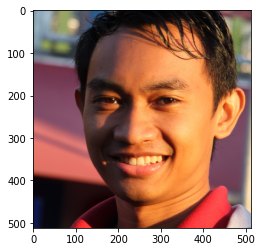

In [ ]:
# @title Model Prediction (ws-latent code) from Input Image (shown below)
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt
!cp -r {img_path} '/content/img.png'
img_PIL = None
img = np.array(PIL.Image.open(img_path))
if img.shape[2] > 3:
  print("4 channel image")
  img_PIL = Image.fromarray(img[:, :, 0:3])
img_input = get_preprocessing(img_path, img=img_PIL, model_name=model_name)
input = torch.from_numpy(img_input).to(device).unsqueeze(0) # (1, 512, 512, 3)
print(input.shape)
prediction = model(input) # shape ([1, 7168])
w = transform_latent(prediction).detach() # transform latent code to (1, 14, 512)
plt.imshow(img)

## Generate Image
Synthesize image based on EG3D predicted latent code (style vector)


/content
use predicted latent code
torch.Size([1, 14, 512])
Use fixed camera pose


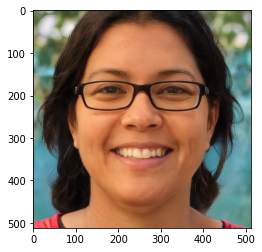

In [ ]:
%cd /content/
sampling_multiplier = 2
outdir = '/content/out/'
os.makedirs(outdir, exist_ok=True)
#@markdown psi-truncation
psi = 0.5 #@param {type: "number"}
#@markdown Save reproduced/predicted image?
save = False #@param {type:"boolean"}
mode = "image" 
# @markdown Preload other latent code? Or a camera pose path?
latent_path = "" # @param {type:"string"}
c_path = "" # @param {type:"string"}
grid = (1,1) # for a single image --> grid is (1x1)
grid_w = grid[0]
grid_h = grid[1]
num_keyframes = 1 # for single frame
wraps = 2 # default
kind='cubic'
fov_deg = 18.837
num = 30
depth_resolution = 96
depth_res_importance = 96
device = torch.device("cuda" if torch.cuda.is_available() else 'cpu')

# Define fixed camera parameters
c = torch.cat((torch.tensor([
                                [-1, 0,  0,  0],
                                [0,  -1, 0,  0],
                                [0,  0,  -1, 2.7],
                                [0,  0,  0,  1]
]).flatten(), torch.tensor([
                                        [4.6, 0, 0.5], #change 4.6 to 3
                                        [0, 4.6, 0.5], #change 4.6  to 3
                                        [0, 0, 3]
]).flatten())) # extrinsic and intrinsic matrix




# Load latent code
if latent_path:
  !cp -r {latent_path} '/content/local.npy'
  w = np.load('/content/local.npy', allow_pickle=True) # load latent code
  print(w.shape)
  if len(w.shape) <=2:
    w = transform_vit_code(w)
  ws = torch.FloatTensor(w).cuda() # latent # 1, 14, 512
  print("Produced image, from input latent path")
else:
  ws = w # assign predicted latent code
  print("use predicted latent code")
  print(w.shape)



# get rigid transformation (does not change shape of object - preserve euclidian distance between points)
#cam2world_pose = LookAtPoseSampler.sample(3.14/2, 3.14/2, torch.tensor([0, 0, 0.2], device=device), radius=2.7, device=device)
#intrinsics = FOV_to_intrinsics(fov_deg, device=device)
#c = torch.cat([cam2world_pose.reshape(-1, 16), intrinsics.reshape(-1, 9)], 1) # camera pose (extrinsic + intrinsic params) - projection matrix
try:
  if c_path:
    print("Loaded camera parameter from path:", c_path)
    
  else:
    # Enable for Prosopo dataset
    c_path = img_path.replace('PTI', 'cam_poses').replace('.png', '.npy') # custom camera pose
    # Enable for Val Set
    #c_path = img_path.replace('images', 'cam_poses').replace('.png', '.npy')
  c = torch.FloatTensor(np.load(c_path)).to(device)
except:
  print("Use fixed camera pose")
  c = c.repeat(ws.shape[0], 1).to(device)



# Generator
with dnnlib.util.open_url('/content/model.pkl') as f:
    G = legacy.load_network_pkl(f)['G_ema'].to(device)  # type: ignore

# Setup rendering options for generator
G.rendering_kwargs['depth_resolution'] = int( depth_resolution * sampling_multiplier)
G.rendering_kwargs['depth_resolution_importance'] = int(depth_res_importance * sampling_multiplier)

# Assert latent format
if ws.shape[1] != G.backbone.mapping.num_ws:
    ws = ws.repeat([1,G.backbone.mapping.num_ws, 1])

_ = G.synthesis(ws[:1], c[:1])  # warm up - sample from projected latent code (of input image) and generate the image

img = G.synthesis(ws[:1], c[:1])[mode] # input a sample latent code ws and the respective camera parameters
img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
if save:
  PIL.Image.fromarray(img[0].cpu().numpy(), 'RGB').save('/content/reproduced.png')
  print("Generated image can be found under", "/content/reproduced.png")
plt.imshow(img[0].cpu().numpy())
pass

## Generate depth & 3D mesh
Synthesize depth based on EG3D predicted latent code (14 stylevectors)

The generated depth map can be found under /content/depth.png


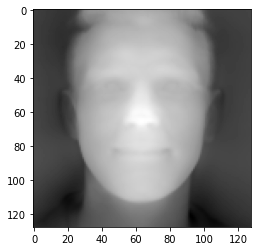

In [ ]:
sampling_multiplier = 2
outdir = '/content/out/'
os.makedirs(outdir, exist_ok=True)
#@markdown psi-truncation
psi = 0.5 #@param {type: "number"}
#@markdown Gray-scale depth map? Save it?
grayscale = True #@param {type:"boolean"}
save = True #@param {type:"boolean"}
#@markdown Reconstruct 3D mesh from depthmap? Save it?
save_mesh = True #@param {type:"boolean"}
mode = "image_depth" 
grid = (1,1) # for a single image --> grid is (1x1)
grid_w = grid[0]
grid_h = grid[1]
num_keyframes = 1 # for single frame
wraps = 2 # default
kind='cubic'
fov_deg = 18.837
num = 30
depth_resolution = 96
depth_res_importance = 96
device = torch.device("cuda" if torch.cuda.is_available() else 'cpu')

# Define fixed camera parameters
c = torch.cat((torch.tensor([
                                [-1, 0,  0,  0],
                                [0,  -1, 0,  0],
                                [0,  0,  -1, 2.7],
                                [0,  0,  0,  1]
]).flatten(), torch.tensor([
                                        [4.6, 0, 0.5], #change 4.6 to 3
                                        [0, 4.6, 0.5], #change 4.6  to 3
                                        [0, 0, 3]
]).flatten())) # extrinsic and intrinsic matrix




# Load latent code
# @markdown Preload other latent code?
latent_path = "" # @param {type:"string"}
if latent_path:
  w = np.load(latent_path, allow_pickle=True) # load latent code
  ws = torch.FloatTensor(w).cuda() # latent # 1, 14, 512
  print("Produced image, from input latent path")
else:
  ws = w # assign predicted latent code



# get rigid transformation (does not change shape of object - preserve euclidian distance between points)
#cam2world_pose = LookAtPoseSampler.sample(3.14/2, 3.14/2, torch.tensor([0, 0, 0.2], device=device), radius=2.7, device=device)
#intrinsics = FOV_to_intrinsics(fov_deg, device=device)
#c = torch.cat([cam2world_pose.reshape(-1, 16), intrinsics.reshape(-1, 9)], 1) # camera pose (extrinsic + intrinsic params) - projection matrix
c = c.repeat(ws.shape[0], 1).to(device)


# Generator
with dnnlib.util.open_url('/content/model.pkl') as f:
    G = legacy.load_network_pkl(f)['G_ema'].to(device)  # type: ignore

# Setup rendering options for generator
G.rendering_kwargs['depth_resolution'] = int( depth_resolution * sampling_multiplier)
G.rendering_kwargs['depth_resolution_importance'] = int(depth_res_importance * sampling_multiplier)

# Assert latent format
if ws.shape[1] != G.backbone.mapping.num_ws:
    ws = ws.repeat([1,G.backbone.mapping.num_ws, 1])


_ = G.synthesis(ws[:1], c[:1])  # warm up - sample from projected latent code (of input image) and generate the image

img = G.synthesis(ws[:1], c[:1])[mode] # input a sample latent code ws and the respective camera parameters
depthpath = '/content/depth.png'
if grayscale:
  depth = -img
  depth = (depth - depth.min()) / (depth.max() - depth.min()) * 2 - 1  # bring to [-1,1]
  depth_image = (depth.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
  plt.imshow(depth_image[0].cpu().numpy()[:,:, 0], cmap='gray')
  if save:
    PIL.Image.fromarray(depth_image[0].cpu().numpy()[:,:, 0], 'L').save(depthpath)
    print("The generated depth map can be found under", depthpath)

else:
  plt.imshow(img[0, 0].cpu().numpy())
  if save:
    plt.imsave(depthpath, img[0, 0].cpu().numpy())
    print("The generated depth map can be found under", depthpath)


if save_mesh:
  ### Save .obj
  try:
    pred_mesh_output = '/content/mesh.obj'
    img_path = depthpath # this is the path of the saved depthmap
    verts, faces, colors = depthImage2mesh(img_path=output_path, output_path=pred_mesh_output, save=True)
    print('Pred. obj is saved under:', pred_mesh_output)
  except:
    print("Cannot reconstruct predicted depth map")

## Dump

### Prosopo reproduced images based on projected latent codes


In [ ]:
#@markdown method for generating image from given latent code
def gen_img_from_latent_code(latent_path, cam_path, output_path, save=False):
  # Load latent code
  if latent_path:
    w = np.load(latent_path, allow_pickle=True) # load latent code
    ws = torch.FloatTensor(w).cuda() # latent # 1, 14, 512
    print("Produced image, from input latent path")
  else:
    ws = w # assign predicted latent code

  try:
    c = torch.FloatTensor(np.load(cam_path)).to(device)
    print("Loaded cam params from camera path:", cam_path)
  except:
    cam2world_pose = LookAtPoseSampler.sample(3.14/2, 3.14/2, torch.tensor([0, 0, 0.2], device=device), radius=2.7, device=device)
    intrinsics = FOV_to_intrinsics(fov_deg, device=device)
    c = torch.cat([cam2world_pose.reshape(-1, 16), intrinsics.reshape(-1, 9)], 1) # camera pose (extrinsic + intrinsic params) - projection matrix
    c = c.repeat(ws.shape[0], 1).to(device)


  # Generator
  with dnnlib.util.open_url('/content/model.pkl') as f:
      G = legacy.load_network_pkl(f)['G_ema'].to(device)  # type: ignore

  # Setup rendering options for generator
  G.rendering_kwargs['depth_resolution'] = int( depth_resolution * sampling_multiplier)
  G.rendering_kwargs['depth_resolution_importance'] = int(depth_res_importance * sampling_multiplier)

  # Assert latent format
  if ws.shape[1] != G.backbone.mapping.num_ws:
      ws = ws.repeat([1,G.backbone.mapping.num_ws, 1])


  _ = G.synthesis(ws[:1], c[:1])  # warm up - sample from projected latent code (of input image) and generate the image

  img = G.synthesis(ws[:1], c[:1])['image'] # input a sample latent code ws and the respective camera parameters
  img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
  if save:
    PIL.Image.fromarray(img[0].cpu().numpy(), 'RGB').save('/content/reproduced.png')
    print("Generated image can be found under", "/content/reproduced.png")
    PIL.Image.fromarray(img[0].cpu().numpy(), 'RGB').save(output_path)
  plt.imshow(img[0].cpu().numpy())

  return img[0].cpu().numpy() # return an array of the RGB image

Produced image, from input latent path: /content/drive/MyDrive/datasets/prosopo/latent/00999.npy
Generated image can be found under /content/reproduced.png
Produced image, from input latent path: /content/drive/MyDrive/datasets/prosopo/latent/01000.npy
Generated image can be found under /content/reproduced.png
Produced image, from input latent path: /content/drive/MyDrive/datasets/prosopo/latent/01001.npy
Generated image can be found under /content/reproduced.png


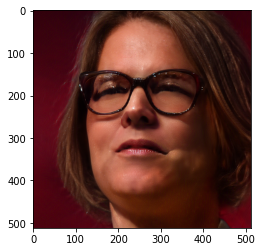

In [ ]:
root_dataset = '/content/drive/MyDrive/datasets/prosopo/input/'
for i in range(999, 1002):
  
  # Generator
  with dnnlib.util.open_url('/content/model.pkl') as f:
      G = legacy.load_network_pkl(f)['G_ema'].to(device)  # type: ignore

  # Setup rendering options for generator
  G.rendering_kwargs['depth_resolution'] = int( 96 * 2)
  G.rendering_kwargs['depth_resolution_importance'] = int(96 * 2)
  
  
  filename = f'{i:05d}.png'
  fullpath = os.path.join(root_dataset, filename)
  reproduction_path = fullpath.replace('input', 'latent_synthesis') # output path to save synthesized/reproduced image from latent code
  device = torch.device("cuda" if torch.cuda.is_available() else 'cpu')
  save = True

  # Load latent code
  latent_path = fullpath.replace('input', 'latent').replace('png', 'npy')
  w = np.load(latent_path, allow_pickle=True) # load latent code
  ws = torch.FloatTensor(w).cuda() # latent # 1, 14, 512
  print("Produced image, from input latent path:", latent_path)

  # Load cam params
  cam_path = latent_path.replace('latent', 'cam_poses')
  c = torch.FloatTensor(np.load(cam_path)).to(device)
  c = c.repeat(ws.shape[0], 1).to(device)


  _ = G.synthesis(ws[:1], c[:1])  # warm up - sample from projected latent code (of input image) and generate the image

  img = G.synthesis(ws[:1], c[:1])['image'] # input a sample latent code ws and the respective camera parameters
  img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
  if save:
    #PIL.Image.fromarray(img[0].cpu().numpy(), 'RGB').save('/content/reproduced.png')
    print("Generated image can be found under", "/content/reproduced.png")
    PIL.Image.fromarray(img[0].cpu().numpy(), 'RGB').save(reproduction_path)
  plt.imshow(img[0].cpu().numpy())

### Generate images for predicted latent codes (val) - Loop

ViT preprocessing
torch.Size([1, 3, 384, 384])
Transform to (1, 14, 512) shape
/content
use predicted latent code
torch.Size([1, 14, 512])
Use fixed camera pose
Generated image can be found under /content/seed49400.png
ViT preprocessing
torch.Size([1, 3, 384, 384])
Transform to (1, 14, 512) shape
/content
use predicted latent code
torch.Size([1, 14, 512])
Use fixed camera pose
Generated image can be found under /content/seed49401.png
ViT preprocessing
torch.Size([1, 3, 384, 384])
Transform to (1, 14, 512) shape
/content
use predicted latent code
torch.Size([1, 14, 512])
Use fixed camera pose
Generated image can be found under /content/seed49402.png
ViT preprocessing
torch.Size([1, 3, 384, 384])
Transform to (1, 14, 512) shape
/content
use predicted latent code
torch.Size([1, 14, 512])
Use fixed camera pose
Generated image can be found under /content/seed49403.png
ViT preprocessing
torch.Size([1, 3, 384, 384])
Transform to (1, 14, 512) shape
/content
use predicted latent code
torch.Size

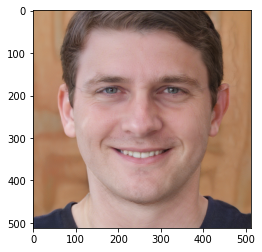

In [ ]:

#root_path = '/content/drive/MyDrive/datasets/prosopo_new/input' #uncomment for prosopo
root_path = '/content/drive/MyDrive/datasets/eg3d/images/'

#for name in os.listdir(root_path):
for i in range(49400, 49495):
  name = f'seed{i:05d}.png' # comment for prosopo
  img_path = os.path.join(root_path, name)
  from PIL import Image
  import numpy as np
  from matplotlib import pyplot as plt
  !cp -r {img_path} '/content/img.png'
  #PIL.Image.open(img_path).save(f'/content/drive/MyDrive/eg3d/experiments/latent_train48000_samples/val_seperate_results/{name}')
  img_PIL = None
  img = np.array(PIL.Image.open(img_path))
  if img.shape[2] > 3:
    print("4 channel image")
    img_PIL = Image.fromarray(img[:, :, 0:3])
  img_input = get_preprocessing(img_path, img=img_PIL, model_name=model_name)
  input = torch.from_numpy(img_input).to(device).unsqueeze(0) # (1, 512, 512, 3)
  print(input.shape)
  prediction = model(input) # shape ([1, 7168])
  w = transform_latent(prediction).detach() # transform latent code to (1, 14, 512)
  plt.imshow(img)
  input_img = img.copy()






  %cd /content/
  sampling_multiplier = 2
  outdir = '/content/out/'
  os.makedirs(outdir, exist_ok=True)
  #@markdown psi-truncation
  psi = 0.5 #@param {type: "number"}
  #@markdown Save reproduced/predicted image?
  save = True #@param {type:"boolean"}
  mode = "image" 
  # @markdown Preload other latent code? Or a camera pose path?
  latent_path = "" # @param {type:"string"}
  c_path = "" # @param {type:"string"}
  grid = (1,1) # for a single image --> grid is (1x1)
  grid_w = grid[0]
  grid_h = grid[1]
  num_keyframes = 1 # for single frame
  wraps = 2 # default
  kind='cubic'
  fov_deg = 18.837
  num = 30
  depth_resolution = 96
  depth_res_importance = 96
  device = torch.device("cuda" if torch.cuda.is_available() else 'cpu')

  # Define fixed camera parameters
  c = torch.cat((torch.tensor([
                                  [-1, 0,  0,  0],
                                  [0,  -1, 0,  0],
                                  [0,  0,  -1, 2.7],
                                  [0,  0,  0,  1]
  ]).flatten(), torch.tensor([
                                          [4.6, 0, 0.5], #change 4.6 to 3
                                          [0, 4.6, 0.5], #change 4.6  to 3
                                          [0, 0, 3]
  ]).flatten())) # extrinsic and intrinsic matrix




  # Load latent code
  if latent_path:
    !cp -r {latent_path} '/content/local.npy'
    w = np.load('/content/local.npy', allow_pickle=True) # load latent code
    print(w.shape)
    if len(w.shape) <=2:
      w = transform_vit_code(w)
    ws = torch.FloatTensor(w).cuda() # latent # 1, 14, 512
    print("Produced image, from input latent path")
  else:
    ws = w # assign predicted latent code
    print("use predicted latent code")
    print(w.shape)


  try:
    if c_path:
      print("Loaded camera parameter from path:", c_path)
      
    else:
      # Enable for Prosopo dataset
      c_path = img_path.replace("prosopo_new", "prosopo").replace('input', 'cam_poses').replace('.png', '.npy') # custom camera pose
      # Enable for Val Set
      #c_path = img_path.replace('images', 'cam_poses').replace('.png', '.npy')
    c = torch.FloatTensor(np.load(c_path)).to(device)
    c = c.repeat(ws.shape[0], 1).to(device)

  except:
    print("Use fixed camera pose")
    c = c.repeat(ws.shape[0], 1).to(device)
  # comment for prosopo dataset
  c = torch.Tensor([[ 1.0000e+00, -6.4913e-09,  4.6791e-08, -1.1706e-07,  0.0000e+00,
         -9.9051e-01, -1.3741e-01,  3.4377e-01,  4.7239e-08,  1.3741e-01,
         -9.9051e-01,  2.6780e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e+00,  4.4652e+00,  0.0000e+00,  5.0000e-01,  0.0000e+00,
          4.4652e+00,  5.0000e-01,  0.0000e+00,  0.0000e+00,  1.0000e+00]]).to(device)  # for zero-pose camera parameters



  # Generator
  with dnnlib.util.open_url('/content/model.pkl') as f:
      G = legacy.load_network_pkl(f)['G_ema'].to(device)  # type: ignore

  # Setup rendering options for generator
  G.rendering_kwargs['depth_resolution'] = int( depth_resolution * sampling_multiplier)
  G.rendering_kwargs['depth_resolution_importance'] = int(depth_res_importance * sampling_multiplier)

  # Assert latent format
  if ws.shape[1] != G.backbone.mapping.num_ws:
      ws = ws.repeat([1,G.backbone.mapping.num_ws, 1])

  _ = G.synthesis(ws[:1], c[:1])  # warm up - sample from projected latent code (of input image) and generate the image

  img = G.synthesis(ws[:1], c[:1])[mode] # input a sample latent code ws and the respective camera parameters
  img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
  if save:
    pred_img = img[0].cpu().numpy()
    #stacked = np.concatenate((input_img, pred_img), axis=1) # save stacked images
    #PIL.Image.fromarray(stacked, 'RGB').save(f'/content/drive/MyDrive/eg3d/experiments/latent_train48000_samples/val_seperate_results/{name}')
    PIL.Image.fromarray(pred_img, 'RGB').save(f'/content/drive/MyDrive/eg3d/experiments/latent_train48000_samples/val_seperate_results/{name.replace(".png", "_vit.png")}')
    print("Generated image can be found under", f"/content/{name}")
  plt.imshow(img[0].cpu().numpy())
  pass



### Generate images for predicted latent codes (Prosopo) - Loop

In [ ]:

root_path = '/content/drive/MyDrive/datasets/prosopo_new/input' #uncomment for prosopo
#root_path = '/content/drive/MyDrive/datasets/eg3d/images/'

#for name in os.listdir(root_path):
for name in os.listdir(root_path):
  #name = f'{i:05d}.png' # comment for prosopo
  img_path = os.path.join(root_path, name)
  from PIL import Image
  import numpy as np
  from matplotlib import pyplot as plt
  !cp -r {img_path} '/content/img.png'
  PIL.Image.open(img_path).save(f'/content/drive/MyDrive/eg3d/experiments/latent_train48000_samples/val_seperate_results/{name}')
  img_PIL = None
  img = np.array(PIL.Image.open(img_path))
  if img.shape[2] > 3:
    print("4 channel image")
    img_PIL = Image.fromarray(img[:, :, 0:3])
  img_input = get_preprocessing(img_path, img=img_PIL, model_name=model_name)
  input = torch.from_numpy(img_input).to(device).unsqueeze(0) # (1, 512, 512, 3)
  print(input.shape)
  prediction = model(input) # shape ([1, 7168])
  w = transform_latent(prediction).detach() # transform latent code to (1, 14, 512)
  plt.imshow(img)
  input_img = img.copy()






  %cd /content/
  sampling_multiplier = 2
  outdir = '/content/out/'
  os.makedirs(outdir, exist_ok=True)
  #@markdown psi-truncation
  psi = 0.5 #@param {type: "number"}
  #@markdown Save reproduced/predicted image?
  save = True #@param {type:"boolean"}
  mode = "image" 
  # @markdown Preload other latent code? Or a camera pose path?
  latent_path = "" # @param {type:"string"}
  c_path = "" # @param {type:"string"}
  grid = (1,1) # for a single image --> grid is (1x1)
  grid_w = grid[0]
  grid_h = grid[1]
  num_keyframes = 1 # for single frame
  wraps = 2 # default
  kind='cubic'
  fov_deg = 18.837
  num = 30
  depth_resolution = 96
  depth_res_importance = 96
  device = torch.device("cuda" if torch.cuda.is_available() else 'cpu')

  # Define fixed camera parameters
  c = torch.cat((torch.tensor([
                                  [-1, 0,  0,  0],
                                  [0,  -1, 0,  0],
                                  [0,  0,  -1, 2.7],
                                  [0,  0,  0,  1]
  ]).flatten(), torch.tensor([
                                          [4.6, 0, 0.5], #change 4.6 to 3
                                          [0, 4.6, 0.5], #change 4.6  to 3
                                          [0, 0, 3]
  ]).flatten())) # extrinsic and intrinsic matrix




  # Load latent code
  if latent_path:
    !cp -r {latent_path} '/content/local.npy'
    w = np.load('/content/local.npy', allow_pickle=True) # load latent code
    print(w.shape)
    if len(w.shape) <=2:
      w = transform_vit_code(w)
    ws = torch.FloatTensor(w).cuda() # latent # 1, 14, 512
    print("Produced image, from input latent path")
  else:
    ws = w # assign predicted latent code
    print("use predicted latent code")
    print(w.shape)


  try:
    if c_path:
      print("Loaded camera parameter from path:", c_path)
      
    else:
      # Enable for Prosopo dataset
      c_path = img_path.replace("prosopo_new", "prosopo").replace('input', 'cam_poses').replace('.png', '.npy') # custom camera pose
      # Enable for Val Set
      #c_path = img_path.replace('images', 'cam_poses').replace('.png', '.npy')
    c = torch.FloatTensor(np.load(c_path)).to(device)
    c = c.repeat(ws.shape[0], 1).to(device)

  except:
    print("Use fixed camera pose")
    c = c.repeat(ws.shape[0], 1).to(device)
  # comment for prosopo dataset
  '''
  c = torch.Tensor([[ 1.0000e+00, -6.4913e-09,  4.6791e-08, -1.1706e-07,  0.0000e+00,
         -9.9051e-01, -1.3741e-01,  3.4377e-01,  4.7239e-08,  1.3741e-01,
         -9.9051e-01,  2.6780e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e+00,  4.4652e+00,  0.0000e+00,  5.0000e-01,  0.0000e+00,
          4.4652e+00,  5.0000e-01,  0.0000e+00,  0.0000e+00,  1.0000e+00]]).to(device)  # for zero-pose camera parameters
  '''


  # Generator
  with dnnlib.util.open_url('/content/model.pkl') as f:
      G = legacy.load_network_pkl(f)['G_ema'].to(device)  # type: ignore

  # Setup rendering options for generator
  G.rendering_kwargs['depth_resolution'] = int( depth_resolution * sampling_multiplier)
  G.rendering_kwargs['depth_resolution_importance'] = int(depth_res_importance * sampling_multiplier)

  # Assert latent format
  if ws.shape[1] != G.backbone.mapping.num_ws:
      ws = ws.repeat([1,G.backbone.mapping.num_ws, 1])

  _ = G.synthesis(ws[:1], c[:1])  # warm up - sample from projected latent code (of input image) and generate the image

  img = G.synthesis(ws[:1], c[:1])[mode] # input a sample latent code ws and the respective camera parameters
  img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
  if save:
    pred_img = img[0].cpu().numpy()
    #stacked = np.concatenate((input_img, pred_img), axis=1)
    PIL.Image.fromarray(pred_img, 'RGB').save(f'/content/drive/MyDrive/eg3d/experiments/latent_train48000_samples/test_seperated_results/{name.replace(".png", "_vit.png")}')
    print("Generated image can be found under", f"/content/{name}")
  plt.imshow(img[0].cpu().numpy())
  pass



ViT preprocessing
torch.Size([1, 3, 384, 384])
Transform to (1, 14, 512) shape
/content
use predicted latent code
torch.Size([1, 14, 512])
Generated image can be found under /content/00535.png
ViT preprocessing
torch.Size([1, 3, 384, 384])
Transform to (1, 14, 512) shape
/content
use predicted latent code
torch.Size([1, 14, 512])
Generated image can be found under /content/01491.png
ViT preprocessing
torch.Size([1, 3, 384, 384])
Transform to (1, 14, 512) shape
/content
use predicted latent code
torch.Size([1, 14, 512])
Generated image can be found under /content/01678.png
ViT preprocessing
torch.Size([1, 3, 384, 384])
Transform to (1, 14, 512) shape
/content
use predicted latent code
torch.Size([1, 14, 512])
Generated image can be found under /content/00491.png
ViT preprocessing
torch.Size([1, 3, 384, 384])
Transform to (1, 14, 512) shape
/content
use predicted latent code
torch.Size([1, 14, 512])
Generated image can be found under /content/00035.png
ViT preprocessing
torch.Size([1, 3,

### Invert Image

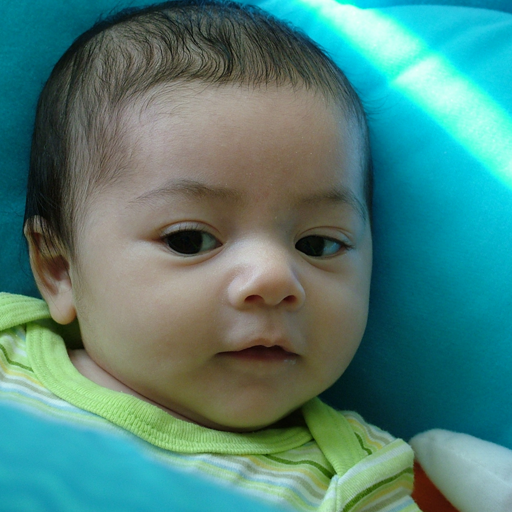

In [ ]:
#@title Invert your own image
from PIL import Image
import requests
import io
import os


download = lambda x: Image.open(io.BytesIO(requests.get(x).content))
#@markdown Image URL. Leave empty if you upload your own
url = "" #@param ["https://thispersondoesnotexist.com/image", ""] {allow-input: true}
#@markdown (Optional) image path if you upload your own
path = "/content/drive/MyDrive/datasets/FFHQ/00000/00000.png"  #@param {type: "string"}
if len(url):
    target = download(url)
else:
    if not os.path.exists(path):
        from google.colab import files
        print("Upload image:")
        uploaded = list(files.upload())
        if uploaded:
            path = uploaded[0]
        else:
            print("Please upload something. Erroring out soon...")
    target = Image.open(path)
target = torch.from_numpy(np.asarray(target.convert("RGB").resize(
    (512, 512))) / 255).to(device)
Image.fromarray((target.detach().cpu().numpy() * 255).astype(np.uint8))

In [ ]:
from IPython.display import display, clear_output
from tqdm.auto import tqdm, trange
from ipywidgets import Output
import camera_utils
import lpips
import os


#@markdown ## Geometry
#@markdown Default camera focal length (tune to match your camera's zoom, 3-6
#@markdown are good values)
focal_length =   4#@param {type: "number"}
focal_length = torch.nn.Parameter(torch.tensor([focal_length],
                                               dtype=torch.float32,
                                               device=device))
#@markdown Default offset (don't go below 2.8, you'll get body horror)
start_z = 3.2  #@param {type: "number"}
try:
    position
except NameError:
    position = torch.nn.Parameter(
        torch.tensor([0, 0, start_z], dtype=torch.float32, device=device))
try:
    rotation
except NameError:
    rotation = torch.nn.Parameter(
        torch.tensor([0, 0, 0], dtype=torch.float32, device=device))
#@markdown ## Init
#@markdown Random seed, 0 for no seed
seed =   25#@param {type: "integer"}
if seed == 0:
    import random
    seed = random.getrandbits(16)
print("Seed:", seed)
torch.manual_seed(seed)
#@markdown How much to scale down the intialisation by (more conservative)
init_scale = 0.9  #@param {type: "number"}
#@markdown Start from a new face latent instead of reusing (turn off if you
#@markdown know what you're doing)
generate_new = True  #@param {type: "boolean"}
try:
    z
    if generate_new:
        abracadabra  # What if someone makes a variable with that name?
except NameError:
    try:
        z_random
        if generate_new:
            abracadabra
    except NameError:
        print('Hello')
        z_random = torch.randn([1, G.z_dim], dtype=torch.float32, device=device)
    z = torch.nn.Parameter(z_random[0] * init_scale)


# It would be shorter to just hardcode
def rotation_matrix(angle, dim=0):
    s = angle.sin()
    c = angle.cos()
    dims = [d for d in range(3) if d != dim]
    return torch.zeros(9).to(angle).index_add(
        0,
        torch.LongTensor([dims[0] + dims[0] * 3,
                          dims[1] + dims[0] * 3,
                          dims[0] + dims[1] * 3,
                          dims[1] + dims[1] * 3, dim + dim * 3
                          ]).to(angle.device), torch.cat([c, s, -s, c,
                                                          angle * 0 + 1
                                                          ])).reshape(3, 3)


def rotate(euler):
    return (
        rotation_matrix(euler[0:1], 0)
        @ rotation_matrix(euler[1:2], 1)
        @ rotation_matrix(euler[2:3], 2))


def get_cam_matrix():
    return torch.tensor(
        [
            [0, 0, 0.5],
            [0, 0, 0.5],
            [0, 0, 1]
        ], dtype=torch.float32, device=device).flatten().index_add(
            0,
            torch.LongTensor([0, 4]).to(device),
            torch.cat((focal_length,) * 2)).reshape(3, 3)


def make_c():
    matrix = torch.tensor([
                        [-1, 0,  0],
                        [0, -1,  0],
                        [0,  0, -1]
    ]).float().to(device)
    matrix = matrix @ rotate(rotation)
    # Position is not rotated
    pos = torch.maximum(torch.tensor([-10, -10, 2.6]).to(position),
                        position)
    matrix = torch.cat((matrix, pos.unsqueeze(-1)), dim=1)
    matrix = torch.cat((matrix, torch.eye(4)[-1:].to(device)), dim=0)
    cam_matrix = get_cam_matrix().flatten()
    return torch.cat((matrix.flatten(), cam_matrix)).float().to(device)


def render():
    return generate(z.unsqueeze(0), make_c()), weights(z.unsqueeze(0), make_c())


#@markdown ## Training
#@markdown (note: you can always interrupt execution and continue with different
#@markdown parameters)
# TODO Make the interrupt begin the fly-around iterations
# TODO show a higher-res image at the end? Or separate images
#@markdown Number of training interations
iterations =   1000  #@param {type: "integer"}
#@markdown Iterations in the end to just fly around
show_iterations = 200  #@param {type: "integer"}
#@markdown Display images every N training steps (make this higher if you see
#@markdown flickering or the notebook slows down)
show_every = 1  #@param {type: "integer"}
#@markdown Save every N steps
save_every = 60  #@param {type: "integer"}
#@markdown Save to this file
save_to = "EG3D.pt"  #@param {type: "string"}
#@markdown Master learning rate
lr =   0.4  #@param {type: "number"}
#@markdown Position, rotation and focal length learning rate
p_lr = 4e-2  #@param {type: "number"}
#@markdown Generator latent learning rate
z_lr = 2e-1  #@param {type: "number"}
#@markdown PTI learning rate
g_lr = 0.0  #@param {type: "number"}
#@,arldpwm Gradient clipping norm
clip_grad_norm = 10.0  #@param {type: "number"}
#@markdown How much to take position into account for loss (experimental)
weight_weight = 0.0  #@param {type: "number"}
#@markdown Loss weight for L2 regularization on latents
reg_weight = 0.01  #@param {type: "number"}
#@markdown Network to be used for LPIPS
lpips_net = "vgg"  #@param {type: "string"} ["vgg", "alex"]
#@markdown LPIPS loss weight
perceptual_weight = 0.2  #@param {type: "number"}
# TODO: add face landmark alignment loss

perceptual_loss = lpips.LPIPS(net=lpips_net).to(device)
optim = torch.optim.Adam([{"params": [position, rotation, focal_length],
                           "lr": p_lr * lr},
                          {"params": [z], "lr": z_lr * lr},
                          {"params": G.parameters(), "lr": g_lr * lr}])
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optim, iterations,
                                                       eta_min=1e-4)
out = Output()
display(out)
frames = []
try:
    with trange((iterations + show_iterations)) as bar:
        for i in bar:
            pic = generate(z.unsqueeze(0), make_c())
            weight =  weights(z.unsqueeze(0), make_c())
            im = to_img(pic, as_torch=True)
            losses = ((im - target) ** 2).mean(dim=-1)
            weight = torch.nn.functional.interpolate(
                weight.unsqueeze(0).unsqueeze(0), (im.shape[0], im.shape[1]))[0, 0]
            weight = weight * weight_weight + (1 - weight_weight)
            mse = (losses * weight.detach()).mean()
            reg = torch.norm(z)
            perceptual = perceptual_loss(
                im.unsqueeze(0).permute(0, 3, 1, 2) * 2 - 1,
                target.unsqueeze(0).permute(0, 3, 1, 2).float() * 2 - 1)
            loss = (
                mse
                + reg * reg_weight
                + perceptual * perceptual_weight)
            bar.set_postfix(loss=loss.item(), mse=mse.item(), reg=reg.item(),
                            perceptual=perceptual.item())
            if i < iterations:
                loss.backward()
                for group in optim.param_groups:
                    torch.nn.utils.clip_grad_norm_(group["params"], clip_grad_norm)
                optim.step()
                optim.zero_grad()
                scheduler.step()
            frame = to_img(pic)
            angle = i / 10
            angled_c = camera_utils.LookAtPoseSampler().sample(
                np.sin(angle) / 2 + np.pi / 2,
                np.cos(np.sin(angle / 2) / 2) / 2 * np.pi,
                torch.zeros(3), radius=start_z)
            pic2 = generate(z.unsqueeze(0),
                            torch.cat((angled_c.flatten().to(device),
                                    get_cam_matrix().flatten())).float().to(
                                        device))
            depth = torch.nn.functional.interpolate(pic2["image_depth"], im.shape[:2]
                                            )[0, 0].cpu().detach().numpy()
            depth -= depth.min()
            depth *= depth.max()
            depth = np.tile((depth[:, :, np.newaxis] * 255).astype(np.uint8),
                            (1, 1, 3))
            frame = Image.fromarray(np.concatenate((
                np.concatenate((
                    np.asarray(frame),
                    depth
                ), axis=0),
                np.concatenate((
                    (np.asarray(target.detach().cpu().numpy())
                    * 255).astype(np.uint8), np.asarray(to_img(pic2))
                ), axis=0)
            ), axis=1))
            frames.append(frame)
            if i % show_every == show_every - 1:
                with out:
                    clear_output(wait=True)
                    display(frame)
            if i % save_every == save_every - 1:
                torch.save((z, (position, rotation, focal_length)), save_to)
except KeyboardInterrupt:
    print("Early exit")

Seed: 25
Hello
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.7/dist-packages/lpips/weights/v0.1/vgg.pth


Output()

  0%|          | 0/1200 [00:00<?, ?it/s]

AssertionError: ignored

In [ ]:
import gc
del pic
gc.collect()

NameError: ignored


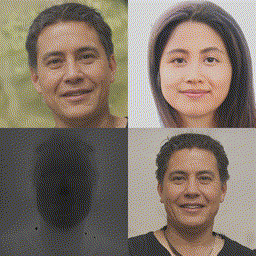

In [ ]:
#@title Save optimization video
from IPython.display import display, HTML
from skvideo.io import FFmpegWriter
from base64 import b64encode


def save_gif(frames, out_path="video.mp4", display=False):
    if display:
        tq = tqdm
    else:
        tq = lambda x: x
    writer = FFmpegWriter(out_path)
    for frame in tq(frames):
        writer.writeFrame(np.asarray(frame))
        if display:
            from IPython.display import display as show
            show(frame)
    writer.close()


#@markdown Set to 128 if the notebook crashes
resolution = 256  #@param {type: "integer"}
out_path = "video.gif"  #@param {type: "string"}
save_gif([f.resize((resolution, resolution)) for f in frames], out_path)
video = open(out_path, "rb").read()
data_url = f"data:image/gif;base64," + b64encode(video).decode()
display(HTML(f"<img src={data_url}>"))

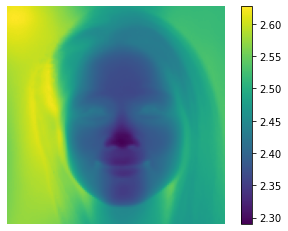

  0%|          | 0/128 [00:00<?, ?it/s]

In [ ]:
#@title (Experimental) 3D Export
import trimesh


im = to_img(pic, as_numpy=True)
im = im[::4, ::4]
focus = (1 / focal_length).item()
step = focus / im.shape[0] * 2
rays = np.mgrid[-focus:focus:step,
                -focus:focus:step]
pic = generate(z.unsqueeze(0), make_c())
depth = torch.nn.functional.interpolate(pic["image_depth"], im.shape[:2]
                                        )[0, 0].cpu().detach().numpy()
plt.axis("off")
plt.imshow(depth)
plt.colorbar()
plt.show()
xyz = np.concatenate(((rays * depth).transpose(1, 2, 0),
                      depth[..., np.newaxis]),
                     axis=-1).reshape(-1, 3)
colors = im.reshape(-1, 3)
faces = []
c = lambda x, y: y * im.shape[1] + x
for y in trange(im.shape[0]):
    for x in range(im.shape[1]):
        if x > 0 and y > 0:
            faces.append([c(x, y), c(x, y - 1), c(x - 1, y)])
        if x < im.shape[1] - 1 and y < im.shape[0] - 1:
            faces.append([c(x, y), c(x, y + 1), c(x + 1, y)])
face_colors = np.asarray([colors[i[0]] for i in faces])
texture = Image.fromarray((im * 255).astype(np.uint8))
uv = np.mgrid[0:im.shape[0], 0:im.shape[1]].reshape(2, -1).T
tri_mesh = trimesh.Trimesh(vertices=xyz[..., [1, 0, 2]] * -1,
                           faces=faces,
                           vertex_colors=colors,
                           smooth=True)

In [ ]:
#@title Save mesh
from datetime import datetime


#@markdown Name of the file (leave empty to name automatically)
mesh_path = ""  #@param ["", "eg3d.ply"] {type: "string", allow-input: true}
#@markdown Path to save in google drive, leave empty if you want to store it in the Colab session only
drive_path = "EG3D"  #@param ["", "EG3D"] {type: "string", allow-input: true}
if not mesh_path:
    # TODO use hash of source image instead?
    mesh_path = f"e-{datetime.strftime(datetime.now(),'%Y_%m_%d-%H_%M_%S')}.ply"

#@markdown Download the resulting .obj file?
download_mesh = True  #@param {type: "boolean"}
kwargs = dict()  # TODO put something here
tri_mesh.export(mesh_path, **kwargs)

if download_mesh:
    from google.colab import files
    files.download(mesh_path)

if drive_path:
    from google.colab import drive
    print("Mounting drive...")
    drive.mount("/content/drive/")
    print("Saving to drive...")
    drive_path = f"/content/drive/MyDrive/{drive_path}"
    os.makedirs(drive_path, exist_ok=True)
    tri_mesh.export(f"{drive_path}/{mesh_path}", **kwargs)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Mounting drive...
Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).
Saving to drive...


### Extra Dump

In [ ]:
def generate(z, c=c, device=device, psi=psi):
    return G(z, c.to(device).unsqueeze(0).repeat(z.shape[0], 1),
             truncation_psi=psi)
    
def to_img(img, mode='image', as_torch=False, as_numpy=False):
  if mode == 'image':
    img = img[mode][0].permute(1, 2, 0) / 3 + 0.5
    if as_torch:
        return img
    img = img.detach().cpu().numpy()
    if as_numpy:
        return img
    return Image.fromarray((np.clip(img, 0, 1) * 255).astype(np.uint8))
  elif mode == 'image_depth':
    img = img[mode][0]
    return img

In [ ]:
# Interpolation.
grid = []
for yi in range(grid_h):
    row = []
    for xi in range(grid_w):
        x = np.arange(-num_keyframes * wraps, num_keyframes * (wraps + 1))
        y = np.tile(ws[yi][xi].cpu().numpy(), [wraps * 2 + 1, 1, 1]) # (5, 14, 512)
        interp = scipy.interpolate.interp1d(x, y, kind=kind, axis=0)
        row.append(interp)
    grid.append(row)

In [ ]:
def linear_interpolate(latent_code,
                       boundary,
                       start_distance=-3.0,
                       end_distance=3.0,
                       steps=10):
  """Manipulates the given latent code with respect to a particular boundary.
  Basically, this function takes a latent code and a boundary as inputs, and
  outputs a collection of manipulated latent codes. For example, let `steps` to
  be 10, then the input `latent_code` is with shape [1, latent_space_dim], input
  `boundary` is with shape [1, latent_space_dim] and unit norm, the output is
  with shape [10, latent_space_dim]. The first output latent code is
  `start_distance` away from the given `boundary`, while the last output latent
  code is `end_distance` away from the given `boundary`. Remaining latent codes
  are linearly interpolated.
  Input `latent_code` can also be with shape [1, num_layers, latent_space_dim]
  to support W+ space in Style GAN. In this case, all features in W+ space will
  be manipulated same as each other. Accordingly, the output will be with shape
  [10, num_layers, latent_space_dim].
  NOTE: Distance is sign sensitive.
  Args:
    latent_code: The input latent code for manipulation.
    boundary: The semantic boundary as reference.
    start_distance: The distance to the boundary where the manipulation starts.
      (default: -3.0)
    end_distance: The distance to the boundary where the manipulation ends.
      (default: 3.0)
    steps: Number of steps to move the latent code from start position to end
      position. (default: 10)
  """
  assert (latent_code.shape[0] == 1 and boundary.shape[0] == 1 and
          len(boundary.shape) == 2 and
          boundary.shape[1] == latent_code.shape[-1])

  linspace = np.linspace(start_distance, end_distance, steps)
  if len(latent_code.shape) == 2:
    linspace = linspace - latent_code.dot(boundary.T)
    linspace = linspace.reshape(-1, 1).astype(np.float32)
    return latent_code + linspace * boundary
  if len(latent_code.shape) == 3:
    linspace = linspace.reshape(-1, 1, 1).astype(np.float32)
    return latent_code + linspace * boundary.reshape(1, 1, -1)
  raise ValueError(f'Input `latent_code` should be with shape '
                   f'[1, latent_space_dim] or [1, N, latent_space_dim] for '
                   f'W+ space in Style GAN!\n'
                   f'But {latent_code.shape} is received.')

In [ ]:
!git clone https://github.com/isl-org/MiDaS
!pip install timm

Cloning into 'MiDaS'...
remote: Enumerating objects: 501, done.
remote: Counting objects: 100% (92/92), done.
remote: Compressing objects: 100% (48/48), done.
remote: Total 501 (delta 69), reused 46 (delta 44), pack-reused 409
Receiving objects: 100% (501/501), 414.88 KiB | 14.82 MiB/s, done.
Resolving deltas: 100% (167/167), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 509 kB 14.4 MB/s 


In [ ]:
# @title Evaluate model
"""Compute depth maps for images in the input folder.
"""
%cd /content/MiDaS
from torchvision.transforms import Compose
from midas.dpt_depth import DPTDepthModel
import torch.optim as optim
import torch.nn as nn
import torch
import os
import cv2
import utils
import numpy as np
import PIL
from midas.transforms import Resize, NormalizeImage, PrepareForNet
from torchvision.transforms import Compose

model_path =  "/content/drive/MyDrive/eg3d/experiments/latent_train10k_samples/b1_e100_weights_ckp_87.pt"#@param
img_path = '/content/drive/MyDrive/datasets/eg3d/images/seed0000.png' #@param
#@markdown or just use a list with img filepaths (e.g val.npy)
img_list_path = None #@param
#output_root = '/content/drive/MyDrive/eg3d/output/' #@param
output_root = '/'.join(model_path.split('/')[:-1])


# select device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device: %s" % device)


net_w, net_h =  512, 512
normalization = NormalizeImage(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
# Input preprocessingg
transform = Compose(
    [
        Resize(
            net_w,
            net_h,
            resize_target=None,
            keep_aspect_ratio=True,
            ensure_multiple_of=32,
            resize_method='minimal',
            image_interpolation_method=cv2.INTER_CUBIC,
        ),
        normalization,
        PrepareForNet(),
    ]
)

model.eval()
model.to(device)

try:
  img_list = np.load(img_list_path, allow_pickle=True).item()['valX']
except:
  print('Img path list is not used or wrong path/format')
  img_list = [[img_path], ]


# get input
with torch.no_grad():
  for path in img_list:
    img_path = path[0]
    img = utils.read_image(img_path) 
    img_input = transform({"image": img})["image"]
    input = torch.from_numpy(img_input).to(device).unsqueeze(0)
    prediction = model(input)
    prediction = prediction.squeeze().detach().cpu().numpy().transpose() # convert to (1, 14, 512)
    img_name = 'out'
    example = img_path.split('/')[-1].split('.')[0] # name of sample
    os.makedirs(os.path.join(output_root, example), exist_ok=True)
    filename = os.path.join(
    os.path.join(output_root,example), os.path.splitext(os.path.basename(img_name))[0])
    output_path = filename + '.png'
    npy_savepath = filename + '.npy'
    #save input image
    PIL.Image.open(img_path).save(output_path.replace('out', 'input'))
    # save latent code
    prediction = np.expand_dims(prediction, axis=0)
    np.save(npy_savepath, prediction)
    

print("finished")
pred_mesh_output = filename + '.obj'
gt_mesh_output = os.path.splitext(pred_mesh_output)[0]+'_gt.obj'


### Save .obj
#verts, faces, colors = depthImage2mesh(img_path=gt_path, output_path=gt_mesh_output, save=True)
#print('GT obj is saved under:   ', gt_mesh_output)

/content/MiDaS
device: cuda
Img path list is not used or wrong path/format
finished
